In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
# import tensorflow as tf

from skimage.io import imread
from matplotlib.colors import TwoSlopeNorm
from scipy.ndimage import convolve, correlate, sobel
# from tensorflow.keras import datasets, layers, models

# Images and Convolutions
### The simple, complex and convoluted notions behind computer vision

<div style="width: 600px; text-align: justify; padding-left: 100px;"> 
    <h4>Abstract</h4>
    <p>
    This work explores key mathematical concepts used in computer vision, aiming to provide simple and intuitive explanations along with meaningful visualizations. It covers image representation as matrices, image arithmetic, convolutions in math and image processing, morphological operators, and convolutional neural networks (CNNs). Practical implementations utilize Python libraries such as numpy, scipy, skimage, and cv2 for image processing, tensorflow for neural networks, and matplotlib for visualizations.
    </p>

</div>

#### References

1. Image Kernels - https://setosa.io/ev/image-kernels/
2. Wikipedia 
    + Convolution - https://en.wikipedia.org/wiki/Convolution
    + Dirach delta - https://en.wikipedia.org/wiki/Dirac_delta_function
    + Kronecker delta - https://en.wikipedia.org/wiki/Kronecker_delta
    + Kernel (image processing) - https://en.wikipedia.org/wiki/Kernel_(image_processing)
    + Sobel operator - https://en.wikipedia.org/wiki/Sobel_operator
3. Paper oriented edge detection https://hal.science/hal-01940320/file/%5BMagnierEUSIPCO2017%5D_Oriented%20Asymmetric_Kernels_for_Corner_Detection_v2.pdf
4. https://docs.scipy.org/
5. https://docs.opencv.org/
6. https://www.geeksforgeeks.org/python-opencv-cv2-blur-method/


#### Helper functions

In [2]:
def plot_image_subplots(
        images, 
        titles=None, 
        subplot_kwargs=None, 
        nrows=1, 
        ncols=3, 
        figsize_hor=12, 
        figsize_ver=6, 
        no_ticks=True
    ):
    """
    Plots a grid of images with titles, allowing for different keyword arguments for each subplot.

    Example usage:
    plot_image_subplots(
        images=[image_1, image_2, image_3],
        titles=["Title 1", "Title 2", "Title 3"],
        plot_kwargs=[
            {"cmap": "gray"},
            {"cmap": "Reds_r", "vmin": 0, "vmax": 1},
            {"cmap": "Blues_r", "vmin": -1, "vmax": 1}
        ],
        nrows=1,
        ncols=3,
        figsize_hor=15,
        figsize_ver=5
    )
    """
    if titles is None:
        titles = ["" for _ in images]
    else:
        assert len(images) == len(titles), "Number of images not equal to number of titles"

    if subplot_kwargs is None:
        subplot_kwargs = [{} for _ in images]
    else:
        assert len(images) == len(subplot_kwargs), "Number of images not equal to number of plot_kwargs"

    for kwargs in subplot_kwargs:
        if "cmap" not in kwargs:
            kwargs["cmap"] = "gray"

    fig, axs = plt.subplots(nrows, ncols, figsize=(figsize_hor, figsize_ver))
    axs = axs.flatten()

    for i, (image, title) in enumerate(zip(images, titles)):
        axs[i].imshow(image, **subplot_kwargs[i])
        axs[i].set_title(title)

    if no_ticks:
        plt.setp(axs, xticks=[], yticks=[])

    plt.tight_layout()
    plt.show()


In [3]:

def limit_range(pixel_value, min_value = 0, max_value = 1): 
    """
    Function to keep the range of pixel values; (0, 1) by default
    """ 
    if pixel_value < min_value:
        pixel_value = min_value
    elif pixel_value > max_value:
        pixel_value = max_value
    return pixel_value

limit_range = np.vectorize(limit_range)

In [4]:
def convolve_3_channel_image(image, filter):
    """
    Applies scipy.ndimage.convolve(image_channel, filter) separately on each channel of the image and
    returns the resulting convolutions stacked to resemble a color image.
    """
    return np.dstack([convolve(image[:, :, i], filter) for i in range(3)])

In [5]:
def plot_convolutions(image, filters, titles = None, subplot_kwargs = None, single_channel = True, **plot_kwargs):
    """
    Plot images resulting from convolution with given filters.
    """
    if single_channel:
        conv_results = [convolve(image, filter) for filter in filters]
    else:
        conv_results = [convolve_3_channel_image(image, filter) for filter in filters]
        

    plot_image_subplots(conv_results, titles, subplot_kwargs, **plot_kwargs)

In [6]:
def plot_heatmaps(arrays, titles = None, nrows = 1, ncols = 2, figsize_hor = 12, figsize_ver = 3, cmap_limit = 0.1):
    """
    Plots a heatmap of each array with a common colorbar. 
    Heatmaps are zero-centered, blue indicating negative values, red - positive.

    """
    if titles is None:
        titles = ["" for _ in arrays]
    else:
        assert len(arrays) == len(titles), "Number of arrays not equal to number of titles"

    # Create the figure and axes
    fig, axs = plt.subplots(nrows, ncols, figsize = (figsize_hor, figsize_ver), layout = "compressed")
    if len(arrays) > 1:
        axs = axs.flatten()
    else:
        axs = [axs]

    # Find the global min and max values across all data for common scaling
    global_min = min(data.min() for data in arrays)
    global_max = max(data.max() for data in arrays)

    global_abs = max([abs(global_min), global_max])

    # Create a common normalization
    norm = TwoSlopeNorm(vmin = - cmap_limit - global_abs, vmax = cmap_limit + global_abs, vcenter = 0)

    # Plot each data array
    for ax, array, title in zip(axs, arrays, titles):
        cax = ax.imshow(array, cmap = "seismic", norm = norm)
        ax.set_title(title)
    
    # Add a single colorbar
    cbar = fig.colorbar(cax, ax=axs[:len(arrays)])
    
    # Remove axis ticks
    plt.setp(axs, xticks=[], yticks=[])
    
 
    plt.show()


## Background - Convolutions in Math

At the beginning - let's explain what hides behind the word "Convolution". At least the math version of it, since in image processing it has somewhat different meaning. This chapter is based on several Wiki pages (see [References](#references)).

Convolution is a mathematical operation on two functions - $f$ and $g$ that produces a third function $ f*g $. It is defined as the integral of the product of the two functions after one is reflected about the y-axis and shifted.  The integral is evaluated for all values of shift, producing the convolution function.

$$ (f * g)(t) = \int_{-\infty}^{\infty} f(\tau) \, g(t - \tau) \, d\tau $$

This integral essentially slides one function over another, multiplying and summing their overlapping values to produce the output at each point. Here is a visualization of the the process of computing a convolution function:


![Convolution animation - Wikipedia](https://upload.wikimedia.org/wikipedia/commons/6/6a/Convolution_of_box_signal_with_itself2.gif)

In discrete form, for sequences $f[n]$ and $g[n]$  convolution is defined as:

$$ (f * g)[n] = \sum_{m=-\infty}^{\infty} f[m] \, g[n - m] $$

Which is quite complex way to describe what is actually a sliding window weighted sum - each output element $ (f * g)[n] $ is the sum of the products of the elements of $ f $ and $ g $ shifted by $ n $. 

Here is a visualization of discrete convolution of two 2d functions as in image processing. $ g $ is denoted as input, $ f $ - as kernel and $ f * g $ - as output.

![Discrete 2D Convolution Animation - Wikipedia](https://upload.wikimedia.org/wikipedia/commons/1/19/2D_Convolution_Animation.gif)

### Algebraic Properties

Some of the algebraic properties of a convolution are:

__Commutativity__:  $ f * g = g * f $

__Associativity__: $ f * (g * h) = (f * g) * h $

__Distributivity__: $ f * (g + h) = (f * g) + (f * h) $

__Multiplicative identity__: No algebra of functions possesses an identity for the convolution. Instead, a function can be convolved with a delta distribution (a unitary impulse, centered at zero) or approximations of the identity can be found. 

__Identity Element__:
$ f * \delta = f $, 
where $ \delta $ is the Dirac delta function for continuous convolution or the Kronecker delta for discrete convolution.



Dirac delta function $ \delta $, also known as unit impulse, is a function, whose value is zero everywhere except at zero, and whose integral over it's entire domain is equal to one. Since there is no function having this property, modelling the delta "function" usually involves the use of limits or measure theory and the theory of distributions.

![Dirac_function_approximation](https://upload.wikimedia.org/wikipedia/commons/b/b4/Dirac_function_approximation.gif)
<img src="https://www.probabilitycourse.com/images/chapter4/Delta-Pulse_b.png" alt="Delta-Pulse" style="height:300px;">



The Kronecker delta function $ \delta_{ij} $ is a function that returns 1 if the elements $ i $ and $j $ are equal and zero otherwise. In linear algebra, an identity matrix $ I_{m \times n} $ has entries equal to the Kronecker delta.

Kronecker delta: $ \delta_{ij} = 
\begin{cases} 
1 & \text{if } i = j \\
0 & \text{if } i \neq j 
\end{cases}
$
Identity matrix:
$
I_{m \times n} = 
\begin{bmatrix}
1 & 0 & 0 & \cdots & 0 \\
0 & 1 & 0 & \cdots & 0 \\
0 & 0 & 1 & \cdots & 0 \\
\vdots & \vdots & \vdots & \ddots & \vdots \\
0 & 0 & 0 & \cdots & 1
\end{bmatrix}
$




### Applications

Convolutions have many applications due to their ability to capture relationships and their relatively low computational complexity. Some applications across various disciplines:

+ In statistics, a weighted moving average is a convolution
+ In probability theory, the probability distribution of the sum of two independent random variables is the convolution of their individual distributions.
+ In acoustics, reverberation is the convolution of the original sound with echoes from objects surrounding the sound source.
+ In optics, an out-of-focus photograph is a convolution of the sharp image with a lens function. 
+ In electrical engineering, the convolution of one function (the input signal) with a second function (the impulse response) gives the output of a linear time-invariant system (LTI). 
+ And of course, image processing and computer vision - those we will discuss later in this work.



## Basic - Images as Matrices

Images can be represented as matrices where each element corresponds to a pixel's intensity value. In a grayscale image, the matrix has a single channel with values typically ranging from 0 (black) to 255 (white), while color images have three channels (red, green, and blue). This matrix representation forms the basis for computer vision, allowing linear algebra rules to be applied to image processing and analysis.

Let's read an image of a cat and use it to visualize the concepts we are exploring:

In [13]:
cat_image_url = "https://d17fnq9dkz9hgj.cloudfront.net/uploads/2012/11/140272627-grooming-needs-senior-cat-632x475.jpg"
cat_image = imread(cat_image_url)

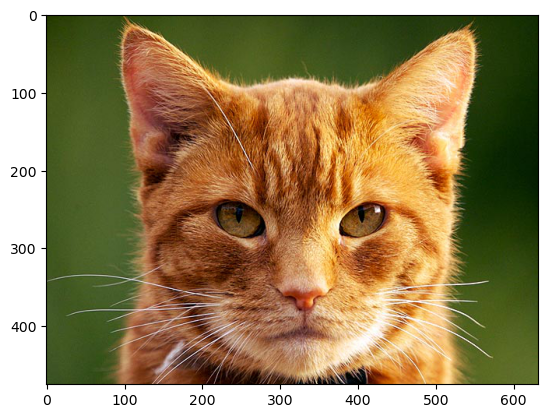

In [14]:
plt.imshow(cat_image)
plt.show()

In [15]:
print(f"Shape: {cat_image.shape}")
print(f"min pixel value: {cat_image.min()}; max pixel value: {cat_image.max()}")

Shape: (475, 632, 3)
min pixel value: 0; max pixel value: 255


This is our color image - 475 pixels high, 632 ptxels wide, 3 channels, or a 475x632x3 matrix.
For convenience we normalize our image (make the range 0 to 1 instead of 0 to 255) and split the red, green and blue channels. Since we read the image with skimage, we are sure that the order is RGB (and not BGR as in OpenCV).

In [16]:
# normalize
cat_image = cat_image / 255

print(f"min pixel value: {cat_image.min()}; max pixel value: {cat_image.max()}")


min pixel value: 0.0; max pixel value: 1.0


In [17]:
# split channels
cat_image_r, cat_image_g, cat_image_b = [cat_image[:, :, i] for i in range(3)]

We plot each channel. The colormaps are inverted so that white places appear white and dark places appear dark - the way the human eye perceives it. In this setting lower pixel values (the absence of the color) is indicated by darker places. 

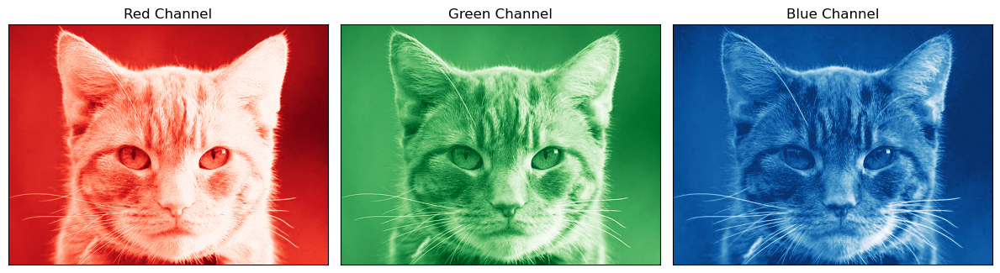

In [18]:
plot_image_subplots(
    images=[cat_image_r, cat_image_g, cat_image_b],
    titles=["Red Channel", "Green Channel", "Blue Channel"],
    subplot_kwargs=[{"cmap": "Reds_r"}, {"cmap": "Greens_r"}, {"cmap": "Blues_r"}],
)


Speaking of lighter/darker regions, let's compute the grayscale of the image. Easiest way of doing it is averaging the red, green and blue intensity. This is effectively the element-wise mean of the tree channels. However, the human eye is less susceptive to blue and red than to green, so to achieve aesthetically pleasing image with similar light intensity to the original one, we use different coefficients for red, green and blue channels. This is known as gamma-correction (luminance correction).

In [19]:
cat_image_gray = cat_image.mean(axis = 2)  
cat_image_gray_corrected = (0.299 * cat_image_r + 
                            0.587 * cat_image_g + 
                            0.114 * cat_image_b)

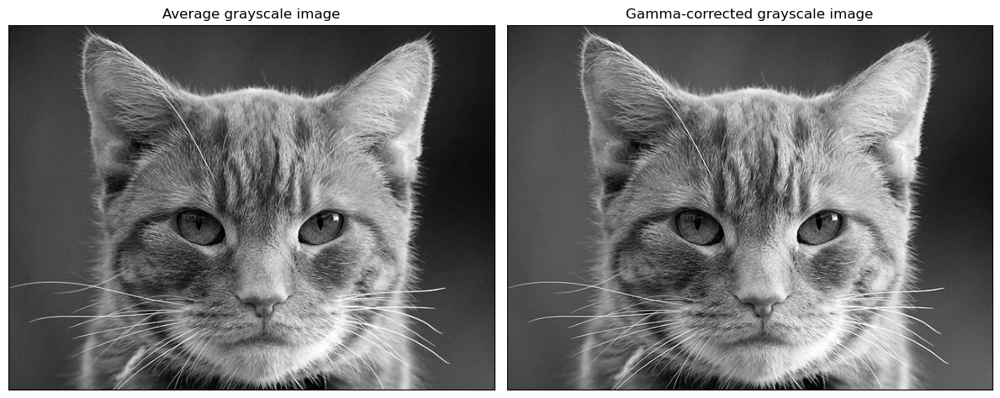

In [20]:
plot_image_subplots(
    images=[cat_image_gray, cat_image_gray_corrected],
    titles=["Average grayscale image", "Gamma-corrected grayscale image"],
    ncols=2
)


## Simple - Image Arithmetic

Here starts the fun part - since our images are 2 or 3-dimensional matrices, we can make all kinds of arithmetical operations with them. For convenience we call the grayscale generic `cat` and the color image - `ginger`. 

In [21]:
cat = cat_image_gray_corrected
ginger = cat_image

First, we visualize simple arithmetic operations—addition, subtraction, multiplication, division, and power/root operations—on an image with a scalar. In addition to these basics, we implement custom thresholding: multi-step to limit the number of shades (pixel values) in the image, and single-value to convert to a black-and-white image. All values are chosen to create visually appealing plots that emphasize the properties of each operation, though these operations are valid with any real number. For valid comparison between results, we limit the range of these results to 0-1 (where values below 0 are set to 0 and values above 1 are set to 1).

In [22]:
def custom_map(px):
    if px < 0.15:
        return 0
    elif px < 0.3:
        return 0.15
    elif px < 0.7:
        return px
    elif px < 0.85:
        return 0.7
    return 1

custom_map = np.vectorize(custom_map)

In [23]:
def black_and_white(px, limit_value = 0.5):
    if px < limit_value:
        return 0
    return 1

black_and_white = np.vectorize(black_and_white)

In [24]:
titles_arithmetic = [
    "Original Image",
    "Add - Brightness Increased",
    "Subtract - Brightness Decreased",
    "Custom Color Mapping",
    "Multiply - Contrast Increased",
    "Divide - Contrast Decreased",
    "Black and White",
    "Power < 1 - Gamma Light Correction",
    "Power > 1 - Gamma Dark Correction"
    ]

In [25]:
cats_arithmetic = [
    cat,
    limit_range(cat + 0.3),
    limit_range(cat - 0.1),
    custom_map(cat),
    limit_range(cat * 2),
    limit_range(cat / 2),
    black_and_white(cat),
    limit_range(cat ** 0.3),
    limit_range(cat ** 3)   
]

In [26]:
gingers_arithmetic = [
    ginger,
    limit_range(ginger + 0.3),
    limit_range(ginger - 0.1),
    custom_map(ginger).astype(np.float32), # casting to float to be recognized as rgb in matplotlib ...
    limit_range(ginger * 2),
    limit_range(ginger / 2),
    black_and_white(ginger).astype(np.float32), # ... images need to be float (0 to 1) or int (0 to 255)
    limit_range(ginger ** 0.3),
    limit_range(ginger ** 3)   
]


The plots for grayscale image and scalar arithmetic:

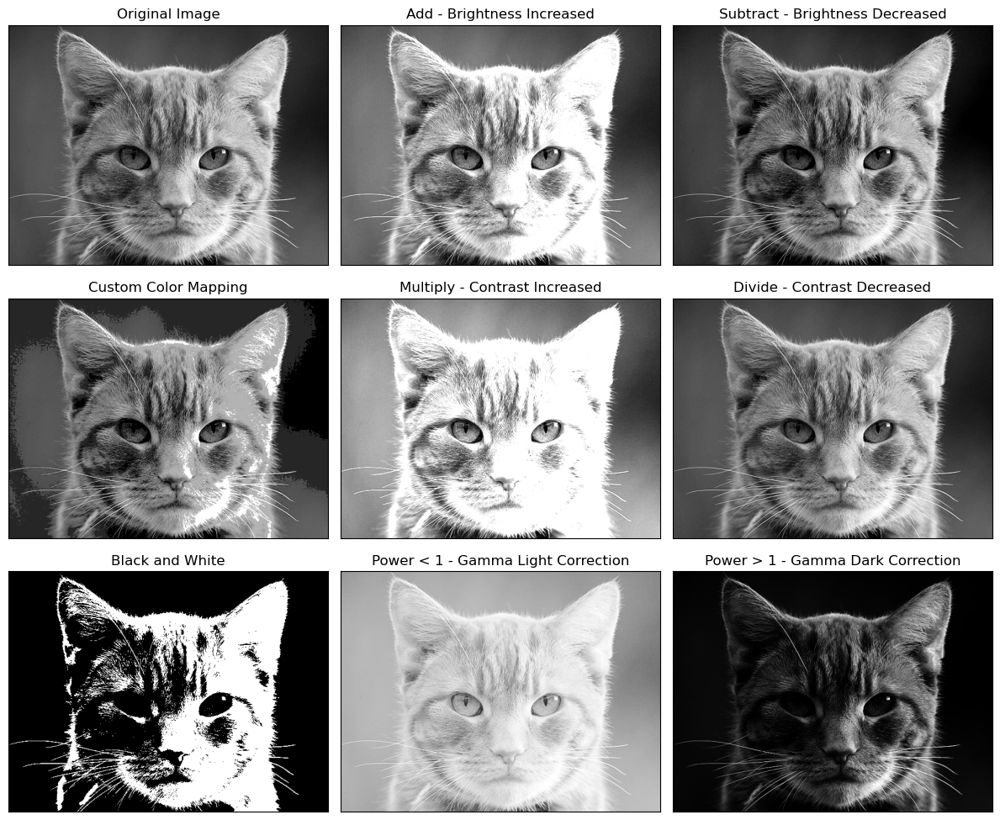

In [27]:
plot_image_subplots(
    images = cats_arithmetic,
    titles = titles_arithmetic,
    nrows=3,
    figsize_ver=10
)



And the color ones:

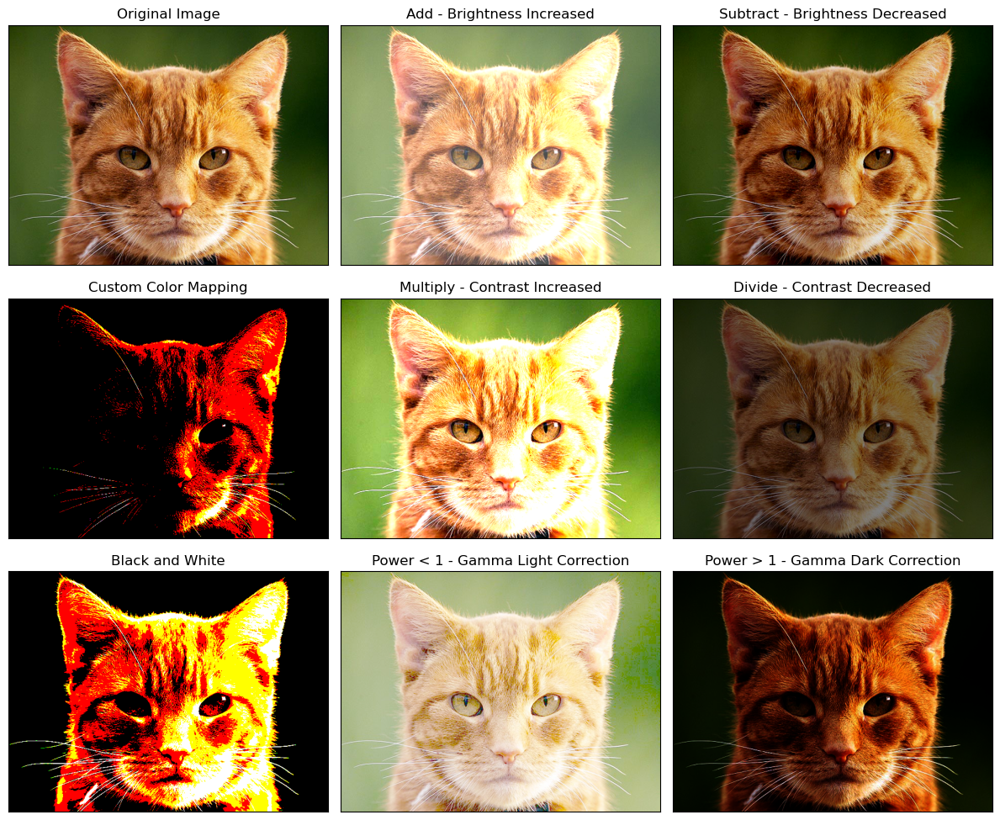

In [28]:
plot_image_subplots(
    images = gingers_arithmetic,
    titles = titles_arithmetic,
    nrows = 3,
    figsize_ver = 10
)


One operation that deserves it's own plot is inverting an image - or multiplying with minus one. 

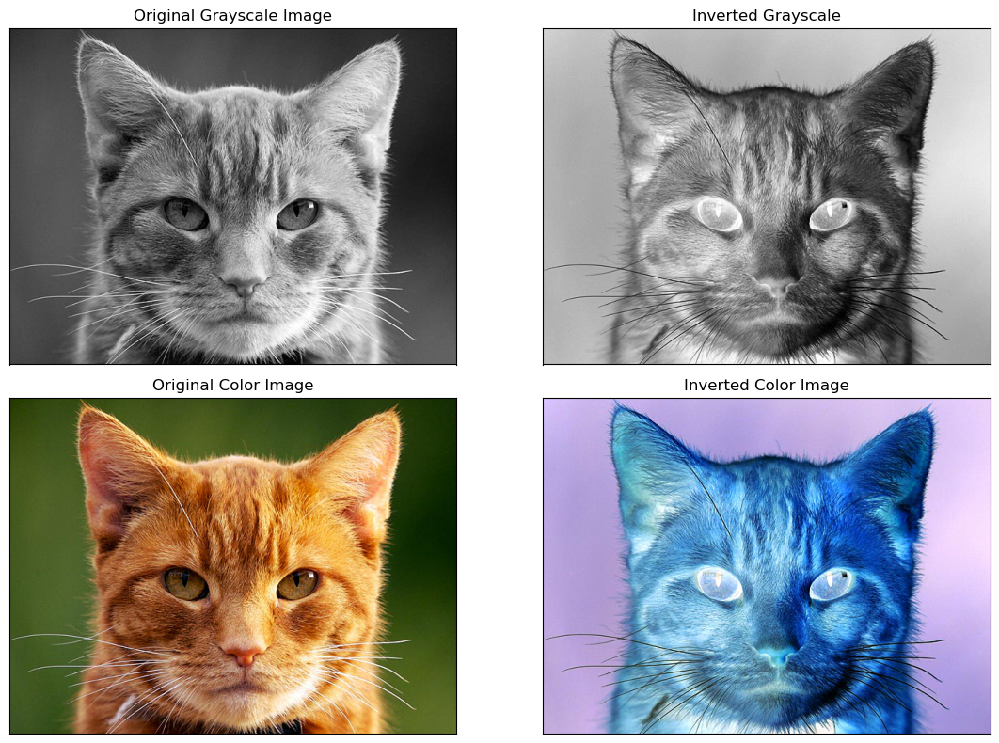

In [29]:
plot_image_subplots(
    images=[
        cat,
        cat * -1,
        ginger,
        (ginger * -1) + 1 # + 1 instead of vmin = -1, vmax = 0
    ],
    titles=[
        "Original Grayscale Image",
        "Inverted Grayscale",
        "Original Color Image",
        "Inverted Color Image"

    ],
    ncols = 2, 
    nrows = 2,
    figsize_ver = 8
)


Now we make math with two images — performing element-wise arithmetic operations on matrices of the same size. Since using the same image twice is an edge case, we need another image. And what fits better with a cat than a box?

In [30]:
box_url = "https://shmector.com/_ph/10/356948332.png"
box_raw = imread(box_url)
box_raw.shape

(1500, 1500, 3)

Again normalize and cast to grayscale:

In [31]:
#Normalize
box_image = box_raw.copy() / 255
#grayscale
box_image = box_image.mean(axis=2)


And since our box is way too big, we downsample it - take every n-th pixel amd drop the rest.

In [32]:
box_image.shape

(1500, 1500)

In [33]:
def downsample_image(image, n):
    return image[::n, ::n]

In [34]:
box = downsample_image(box_image, 4)
box.shape

(375, 375)

And than pad it with white (ones) to match the cat shape.

In [35]:
pad_x = 100
pad_y = 125


box = np.pad(
    box, 
    ((pad_x, 475-box.shape[0]-pad_x), (pad_y, 632-box.shape[1]-pad_y)), 
    'constant', constant_values = 1
    )

box.shape

(475, 632)

In [36]:
assert cat.shape == box.shape

Make a 3-channel box for our ginger by stacking three grayscales - it's easier than downsampling and padding the color image of the box. Our gray shades are a bit off with all the shortcuts we took, but it is not important in this case.

In [37]:
box_color = np.dstack([box, box, box])
box_color.shape

(475, 632, 3)

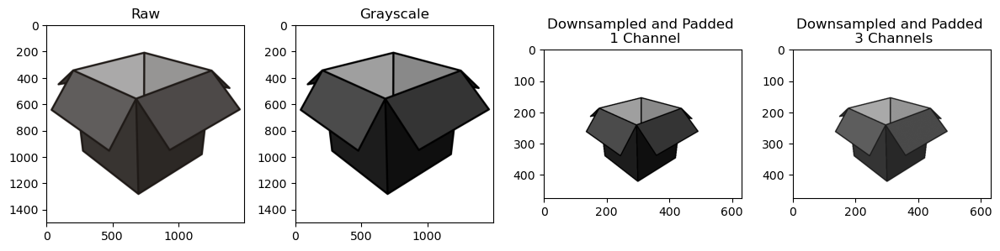

In [38]:
plot_image_subplots(
    images=[
        box_raw,
        box_image,
        box,
        box_color
    ],
    titles=[
        "Raw",
        "Grayscale",
        "Downsampled and Padded \n 1 Channel",
        "Downsampled and Padded \n 3 Channels"
    ],
    ncols = 4,
    no_ticks=False
)


In [39]:
titles_box_arithmetic = [
        "Cat",
        "Cat + Box",
        "Cat - Box",
        "Box - Cat",
        "Box",
        r"Cat $ \times $ Box",
        r"$Cat^{Box}$",
        r"$Box^{Cat}$"
    ]

In [40]:
cat_box_arithmetic=[
        cat,
        cat + box,
        cat - box,
        box - cat,
        box,
        cat * box,
        cat ** box,
        box ** cat
    ]

In [41]:
ginger_box_arithmetic=[
        ginger,
        ginger + box_color,
        ginger - box_color,
        box_color - ginger,
        box_color,
        ginger * box_color,
        ginger ** box_color,
        box_color ** ginger
    ]

Plot our cat - box arithmetic: 

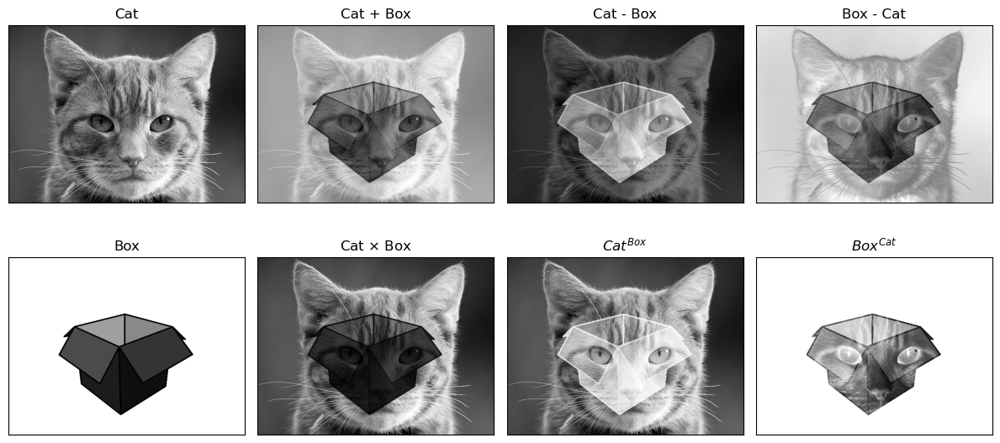

In [42]:
plot_image_subplots(
    images = cat_box_arithmetic,
    titles = titles_box_arithmetic,
    nrows = 2,
    ncols = 4
)

And the ginger - box one:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


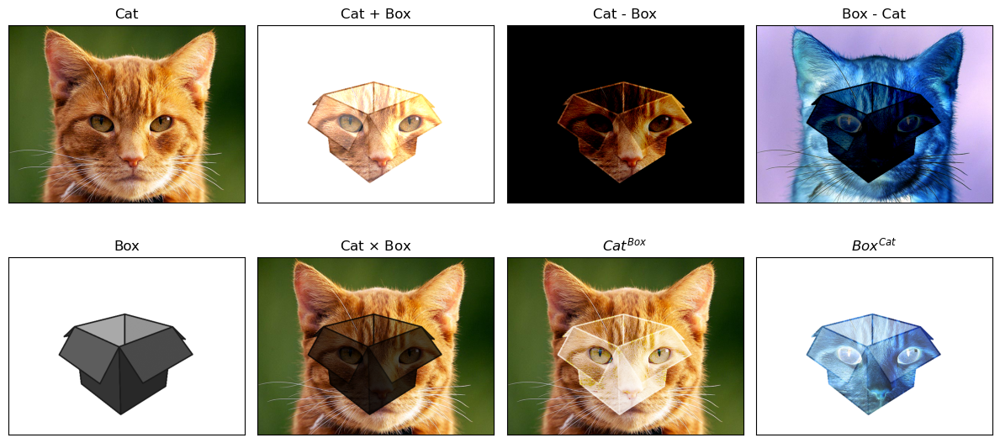

In [43]:
plot_image_subplots(
    images = ginger_box_arithmetic,
    titles = titles_box_arithmetic,
    nrows = 2,
    ncols = 4
)


We forgot to limit our pixel values, but matplotlib took care of that for us.

## Complex - Image Convolutions

Now, we've come to the point to explain what a `convolution` is in image processing. First, it is a convolution of two two-dimensional functions (no, i did not stutter - 2 functions that are 2-dimensional), and second - it is not really a convolution (haha - more on that later).  The first "function" is the image itself, and the second is the filter or kernel. The filter/kernel is typically square and of an odd size (e.g., 3x3, 5x5, ... 101x101, ...). Since a color image is represented by a three-dimensional matrix, it cannot be convolved directly with a two-dimensional filter. Therefore, convolution is either performed on grayscale images or independently on each color channel of a color image.

We choose an random filter to explore (or not so random, needs to be asymmetrical and with negative values to depict our point properly).

In [94]:
conv_filter = np.array([
    [1, 2, -3],
    [4, 5, -6],
    [7, -8, -9]
])

And we covolve it with our cat. The result is a matrix matching our original image shape, so we can interpret it as an image and plot it:

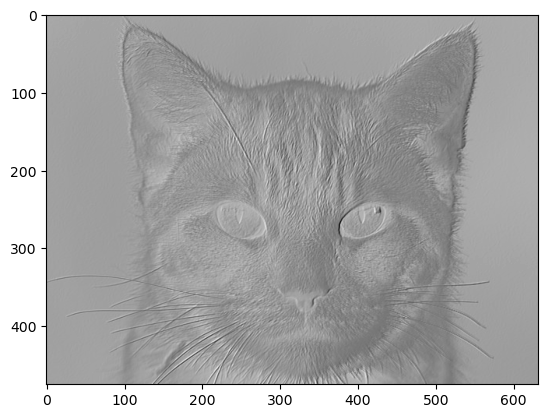

In [95]:
plt.imshow(convolve(cat, conv_filter), cmap = "gray")
plt.show()

So we have an image, apply scipy's magic function and the result is a processed image, still very much recognizable as cat. To open the black box and see what's actually inside, we write our own convolution with numpy only.

### Image convolution with numpy

Each value in result is 
, where W is the weights kernel, j is the N-D spatial index over 
, I is the input and k is the coordinate of the center of W, specified by origin in the input parameters.

In [109]:
def convolve_np(image, filter, flip_filter = True):
    n, m = image.shape
    s = filter.shape[0]
    assert filter.shape[0] == filter.shape[1], "Filter must be a square matrix"
    assert s % 2 == 1, "Filter size must be an odd number"

    # Pad input image with zeros
    pad_width = s // 2
    padded_image = np.pad(image, pad_width, mode = 'constant', constant_values = 0)

    # Prepare the output array - zeroes (to be updated later) with shape matching the input 
    output_array = np.zeros_like(image)

    # Add option of flipping the filter
    #  See convolution vs. correlation
    if flip_filter:
        filter = np.flip(filter)

    # Perform the convolution - for each element of the original input image I(i, j),
    # extract sliding window,
    for i in range(n):
        for j in range(m):
            # Extract sliding window - current element is the center and window shape matches the filter shape (s, s)
            window = padded_image[i:i+s, j:j+s]
            # Perform element-wise multiplication of the window with the filter and sum resulting values
            # End result (a single number) is written in the output matrix at it's designated index (i, j)
            output_array[i, j] = np.sum(window * filter)
    
    return output_array

We take a small part of our image and apply our function on it:

In [110]:
mock_image = cat[:5, :5]

In [111]:
numpy_conv = convolve_np(mock_image, conv_filter)
numpy_conv

array([[ 2.03322353,  0.50830588,  0.52791373,  0.55447059, -0.34850196],
       [ 1.86289412, -1.18872941, -1.13898824, -1.14648627, -3.29735686],
       [ 1.85752941, -1.19409412, -1.14167059, -1.15044314, -3.28202353],
       [ 1.85102353, -1.18783529, -1.13272941, -1.13101961, -3.27116078],
       [ 1.361     , -1.17556471, -1.13242745, -1.13433725, -3.117     ]])

To verify our convolution is doing what's it is supposed to do, we calculate the same operation with Scipy, specifying constant padding with zeroes (the same that we've hardcoded in our function):

In [112]:
scipy_conv = convolve(mock_image, conv_filter, mode = "constant", cval = 0)
scipy_conv

array([[ 2.03322353,  0.50830588,  0.52791373,  0.55447059, -0.34850196],
       [ 1.86289412, -1.18872941, -1.13898824, -1.14648627, -3.29735686],
       [ 1.85752941, -1.19409412, -1.14167059, -1.15044314, -3.28202353],
       [ 1.85102353, -1.18783529, -1.13272941, -1.13101961, -3.27116078],
       [ 1.361     , -1.17556471, -1.13242745, -1.13433725, -3.117     ]])

In [113]:
assert np.allclose(scipy_conv, numpy_conv)

Hurray, we have a properly working function! However one equal result may be coincidence, so we try a few more times:

In [114]:
# Create a random number generator
rng = np.random.default_rng()

for _ in range(10):

    # Choose random filter size from the list of options
    valid_filter_sizes = [3, 5, 7, 11]
    filter_size = int(np.random.choice(valid_filter_sizes, size=1))
   
    # Create filter of the chosen size with random values 
    # Note: real range is (-inf, inf), but np.inf is float and cannot be used as range boundary
    # Hardcoded (-100, 100) instead
    rand_filter = np.random.uniform(-100, 100, size=(filter_size, filter_size))

    # Generate random shape (hight, width) for an image
    # Note: size of the image shouldn't matter, hardcoded min 10 pixels, max 200 
    image_shape = rng.integers(10, high = 200 , size = 2)

    # Create an image-like array
    # Note: values are in the interval [0, 1), need to be [0, 1], but we leave it like that
    image = np.random.random(image_shape)


    # Calculate convolutions with our function and numpy
    numpy_conv_result = convolve_np(image, rand_filter)
    scipy_conv_result = convolve(image, rand_filter, mode = "constant", cval = 0)

    assert np.allclose(scipy_conv_result, numpy_conv_result), "Scipy and custom convolution result mismatch."


Our testing is a bit sketchy, but we leave it be. At least the function passed :)

### Convolution vs. Cross-corelation

Let's come back to the part with flipping the filter. This is done because the definition of convolution states "convolution is the integral of the product of two functions after one is reflected about the y-axis and shifted". Since our function (the filter) is two-dimensional, it needs to be reflected about both axes. This is exactly what `np.flip` does - let's see that:

In [115]:
conv_filter_flipped = np.flip(conv_filter)

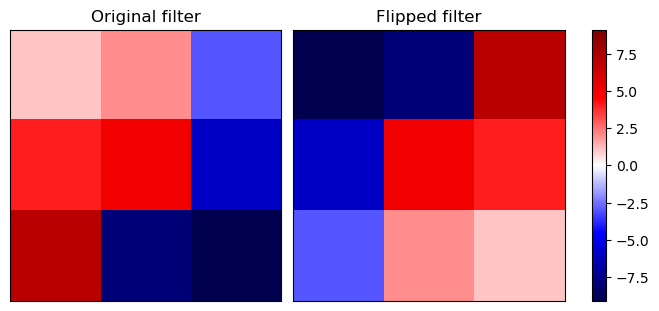

In [116]:
plot_heatmaps([conv_filter, conv_filter_flipped], titles = ["Original filter", "Flipped filter"])

And the result of result of the convolution with flipped filter is the same, just ... (wait for it) ...FLIPPED:

In [117]:
scipy_conv_flipped = convolve(mock_image, conv_filter_flipped, mode = "constant", cval = 0)

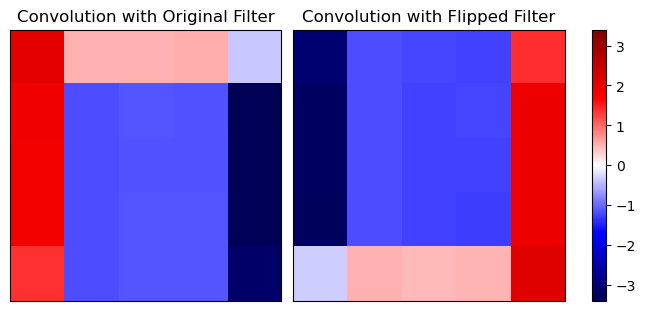

In [118]:
plot_heatmaps(
    [scipy_conv, scipy_conv_flipped], 
    titles = ["Convolution with Original Filter", "Convolution with Flipped Filter"]
)

So when the result is the same, why flip stuff around? Let's try our function without flipping:

In [119]:
numpy_conv_no_flip = convolve_np(mock_image, conv_filter, flip_filter=False)

### Todo

In [89]:
scipy_corr = correlate(mock_image, conv_filter, mode = "constant", cval = 0)
scipy_corr

array([[-3.04983529, -1.18604706, -1.24487059, -1.24858824,  1.39400784],
       [-3.21122353, -1.17084706, -1.24769412, -1.24625098,  1.90334902],
       [-3.19870588, -1.17621176, -1.25037647, -1.26428627,  1.88672157],
       [-3.22442745, -1.19297255, -1.2644549 , -1.27682353,  1.90272157],
       [-0.3384902 ,  0.50984706,  0.47455294,  0.49778039,  2.08503922]])

In [90]:
scipy_conv_flip = np.flip(scipy_conv)
scipy_conv_flip

array([[-3.117     , -1.13433725, -1.13242745, -1.17556471,  1.361     ],
       [-3.27116078, -1.13101961, -1.13272941, -1.18783529,  1.85102353],
       [-3.28202353, -1.15044314, -1.14167059, -1.19409412,  1.85752941],
       [-3.29735686, -1.14648627, -1.13898824, -1.18872941,  1.86289412],
       [-0.34850196,  0.55447059,  0.52791373,  0.50830588,  2.03322353]])

In [91]:
assert np.allclose(scipy_corr, numpy_conv_no_flip)

In [92]:
np.allclose(scipy_corr, scipy_conv_flip, rtol = 0.12)

True

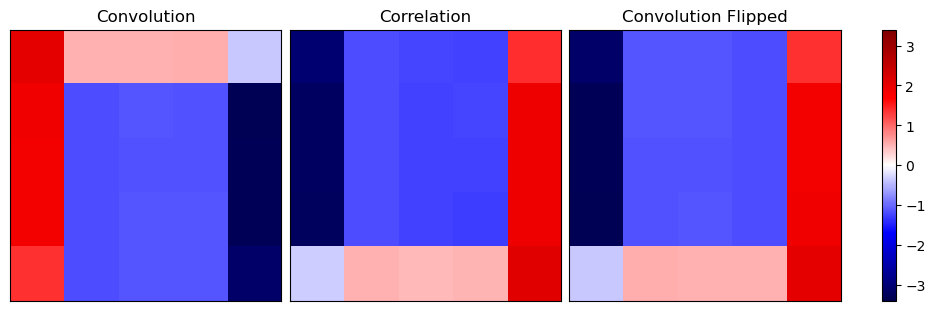

In [93]:
plot_heatmaps(
    [
    scipy_conv, 
    scipy_corr,
    scipy_conv_flip, 
    ], 
    titles = [
    "Convolution",
    "Correlation",
    "Convolution Flipped"
    ],
    ncols = 3
)

### Common filters

#### Identity, ones, minus ones

In [94]:
# identity
identity_filter = np.array([
    [0,0,0], 
    [0,1,0],
    [0,0,0]
])

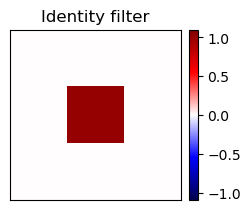

In [95]:
plot_heatmaps(
    [identity_filter], 
    titles=["Identity filter"], 
    ncols=1, 
    figsize_ver = 2
)

In [96]:
 # filter with 1, 1, 1 does nothing
ones_filter = np.ones([3, 3])

In [97]:
minus_ones_filter = ones_filter.copy() * -1
minus_ones_filter

array([[-1., -1., -1.],
       [-1., -1., -1.],
       [-1., -1., -1.]])

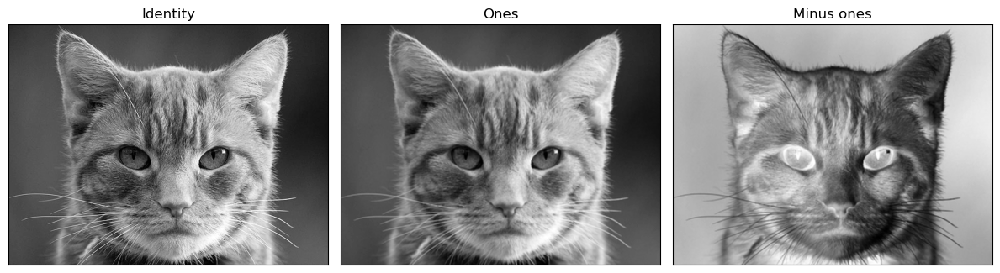

In [136]:
plot_convolutions(
    cat, 
    filters = [
        identity_filter, 
        ones_filter, 
        minus_ones_filter
    ],
    titles = [
        "Identity",
        "Ones",
        "Minus ones"
    ]  
)

#### Mean Filter - Blurr

In [99]:
### Mean Filter - Box Blurr

In [100]:
# mean makes it blurry
# How is blurr useful -> get rid of noise (see also Gaussian blurr)
def mean_filter(s):
    # Box blurr
    return np.ones([s, s]) / s**2

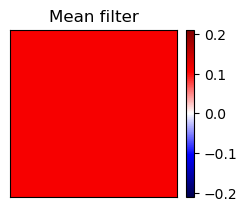

In [101]:
plot_heatmaps([mean_filter(3)], titles =  ["Mean filter"], ncols = 1, figsize_ver = 2)

Mean filters, being really mean, have no visually distinguishable effect on our large sample images. That's why we take a closeup of our cats and apply the mean filters on their faces. (Sounds bad, but we assure you, no cats were hurt during the process.)

In [128]:
cat_face = cat[220:420, 200:400]
ginger_face = ginger[220:420, 200:400]
# Storing indices in variables is a rabbithole, I found no sane solution, If you know one - please share
cat_face.shape, ginger_face.shape

((200, 200), (200, 200, 3))

In [129]:
filter_sizes = [3, 5, 7]

mean_filters = [mean_filter(s) for s in filter_sizes]
mean_filters = [identity_filter] + mean_filters

mean_filter_titles = [f"Mean filter ${s} \\times {s}$" for s in filter_sizes]
mean_filter_titles = ["Identity"] + mean_filter_titles

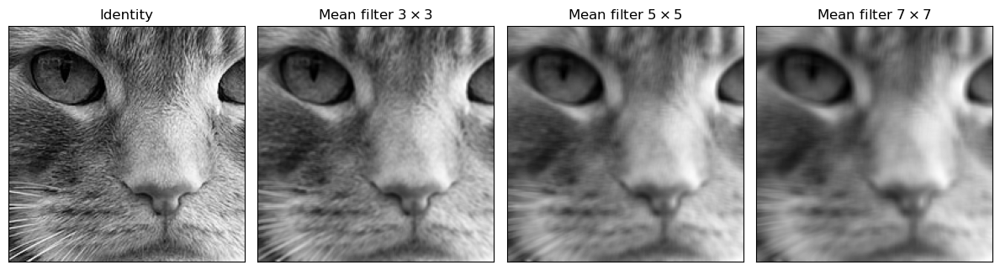

In [137]:
plot_convolutions(
    cat_face,
    filters = mean_filters,
    titles = mean_filter_titles, 
    ncols = 4
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


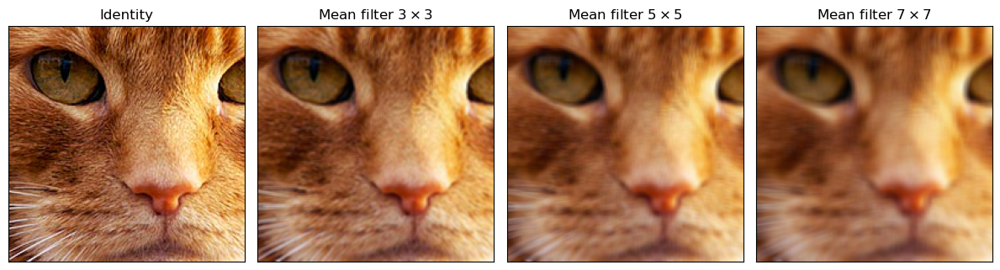

In [141]:
plot_convolutions(
    ginger_face,
    filters = mean_filters,
    titles = mean_filter_titles, 
    ncols = 4,
    single_channel = False
)

In [151]:
filter_size = 15
cat_blur_scipy = convolve(cat, mean_filter(filter_size))
cat_blur_cv = cv.blur(cat, (filter_size, filter_size))

ginger_blur_scipy_stacked = convolve_3_channel_image(ginger, mean_filter(filter_size))
ginger_blur_cv = cv.blur(ginger, (filter_size, filter_size))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


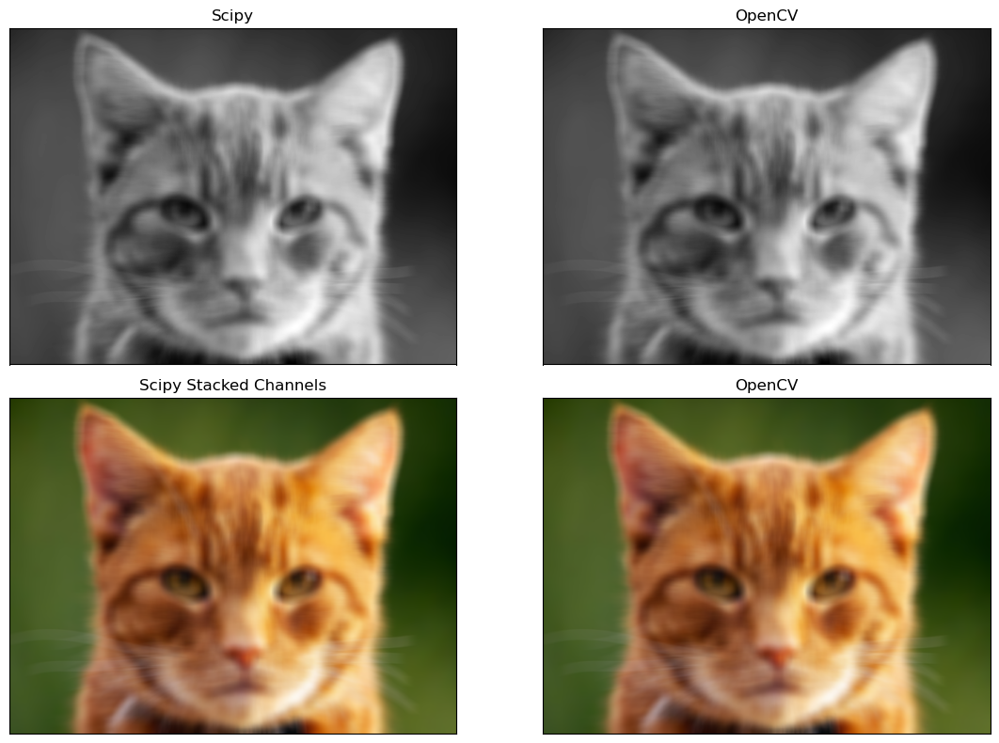

In [152]:
plot_image_subplots(
    [
        cat_blur_scipy,
        cat_blur_cv,
        ginger_blur_scipy_stacked,
        ginger_blur_cv
    ], 
    titles = [
        "Scipy",
        "OpenCV",
        "Scipy Stacked Channels",
        "OpenCV"

    ],
    ncols = 2,
    nrows = 2,
    figsize_ver = 8
    )

Maybe here is the place to mention that OpenCv expects it's color images in BGR not RGB (the way we read it with skimage), but for blurring it shouldn't be an issue. 
We find no visible differences, but let's make sure the results are equal:

In [153]:
np.allclose(
    cat_blur_cv, 
    cat_blur_scipy,
)

False

And no, it is not matter of floating point precision, calculation algorithm or something. After a lot of try and error, we found the differences are in the padding only:

In [156]:
# Indices of results affected by padding
idx_start = filter_size // 2
idx_end = - idx_start - 1

In [157]:
# Area unaffected by padding (basically a cropped image)
np.allclose(
    cat_blur_scipy[idx_start:idx_end, idx_start:idx_end], 
    cat_blur_cv[idx_start:idx_end, idx_start:idx_end],
)

True

In [159]:
# Upper left corner of the image; affected by padding
np.allclose(
    cat_blur_scipy[:idx_start, :], 
    cat_blur_cv[:idx_start, :],
)

False

How much different? Let's see:

In [161]:
np.allclose(
    cat_blur_scipy[:idx_start, :], 
    cat_blur_cv[:idx_start, :],
    rtol = 0.1
)

True

In [163]:
cat_blur_scipy[:idx_start, :].max(), cat_blur_cv[:idx_start, :].max()

(0.3024472679738561, 0.303074422657952)

In [164]:
cat_blur_scipy[:idx_start, :].min(), cat_blur_cv[:idx_start, :].min()

(0.12431897167755948, 0.1250112244008716)

For this range of values, tolerance of 0.1 is huge, meaning border areas are very, very different. Why would that be?

Reading the documentation, the default padding in scipy is 'reflect' and in OpenCv is ... BORDER_REFLECT_101, sooo must be similar? Wrong.

__The importance of hidden defaults__

scipy.ndimage.convolve - default mode is reflect:

‘reflect’ (
`d c b a | a b c d | d c b a`
)
" The input is extended by reflecting about the edge of the last pixel. This mode is also sometimes referred to as half-sample symmetric."

OpenCV - default border is reflect 101:

cv.BORDER_DEFAULT === same as BORDER_REFLECT_101

`gfedcb|abcdefgh|gfedcba`

Which means, both do exactly the same thing, but scipy includes the edge pixel in the mirror image and OpenCV doesen't.

Hah, REFLECT ON DEFAULTS!

Now, let's compare the most basic case of padding - pad with zeroes. And yes, default value for constant padding IS 0 for both, I double checked.

In [165]:
blur_scipy = convolve(cat, mean_filter(filter_size), mode="constant")
blur_cv = cv.blur(cat, (filter_size, filter_size), borderType=cv.BORDER_CONSTANT)

In [166]:
np.allclose(
    blur_scipy, 
    blur_cv,
)

True

#### Gausian Blur

In [58]:
def gaussian_kernel(size, sigma = 1.0):
    """Generate a (size x size) Gaussian kernel with standard deviation sigma.
    
    The size parameter must be an odd number.
    """
    assert size % 2 == 1, "Size must be an odd number."
    
    # Create an (size x size) grid of (x, y) coordinates
    ax = np.arange(-size // 2 + 1, size // 2 + 1)
  
    xx, yy = np.meshgrid(ax, ax)

    
    # Calculate the Gaussian function
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    
    # Normalize the kernel to ensure the sum is 1
    kernel = kernel / np.sum(kernel)
    
    return kernel

In [59]:
gauss_1d = [
    cv2.getGaussianKernel(3, 0).T,
    cv2.getGaussianKernel(5, 0).T,
    cv2.getGaussianKernel(7, 0).T,
    cv2.getGaussianKernel(3, 0.5).T,
    cv2.getGaussianKernel(5, 0.5).T, 
    cv2.getGaussianKernel(7, 0.5).T, 
    cv2.getGaussianKernel(3, 1).T, 
    cv2.getGaussianKernel(5, 1).T, 
    cv2.getGaussianKernel(7, 1).T, 
]

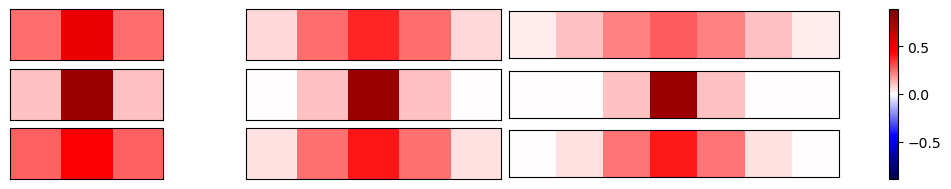

In [60]:
plot_heatmaps(gauss_1d, ncols = 3, nrows=3)

<div style="display: flex; justify-content: space-around;">

<div style="margin: 10px;">
Approximate 3x3 Gaussian kernel:

$$
\frac{1}{16} \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$
</div>

<div style="margin: 10px;">
Approximate 5x5 Gaussian kernel:

$$
\frac{1}{273} \begin{bmatrix}
1 &  4 &  7 &  4 & 1 \\
4 & 16 & 26 & 16 & 4 \\
7 & 26 & 41 & 26 & 7 \\
4 & 16 & 26 & 16 & 4 \\
1 &  4 &  7 &  4 & 1
\end{bmatrix}
$$
</div>

<div style="margin: 10px;">
Approximate 7x7 Gaussian kernel:

$$
\frac{1}{1003} \begin{bmatrix}
  0 &  0 &  1 &  2 &  1 &  0 &  0 \\
  0 &  3 & 13 & 22 & 13 &  3 &  0 \\
  1 & 13 & 59 & 97 & 59 & 13 &  1 \\
  2 & 22 & 97 &159 & 97 & 22 &  2 \\
  1 & 13 & 59 & 97 & 59 & 13 &  1 \\
  0 &  3 & 13 & 22 & 13 &  3 &  0 \\
  0 &  0 &  1 &  2 &  1 &  0 &  0 
\end{bmatrix}
$$
</div>

</div>


In [61]:
gauss_approx_3 = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
]) / 16
gauss_approx_3

array([[0.0625, 0.125 , 0.0625],
       [0.125 , 0.25  , 0.125 ],
       [0.0625, 0.125 , 0.0625]])

In [62]:
gauss_3 = gaussian_kernel(3)
gauss_3

array([[0.07511361, 0.1238414 , 0.07511361],
       [0.1238414 , 0.20417996, 0.1238414 ],
       [0.07511361, 0.1238414 , 0.07511361]])

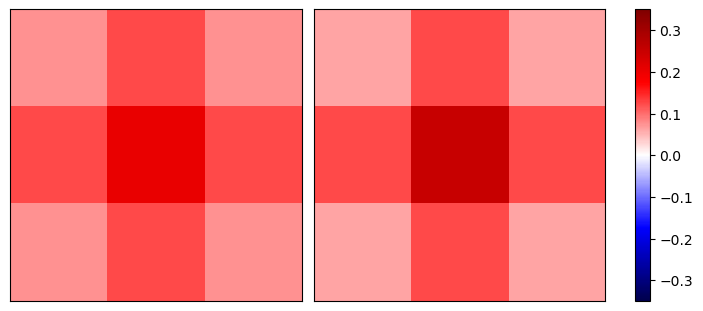

In [63]:
plot_heatmaps([gauss_3, gauss_approx_3, ])

In [64]:
np.allclose(gauss_3, gauss_approx_3), np.allclose(gauss_3, gauss_approx_3, rtol = 0.25)

(False, True)

In [65]:
gauss_approx_5 = np.array([
    [1,  4,  7,  4, 1],
    [4, 16, 26, 16, 4],
    [7, 26, 41, 26, 7],
    [4, 16, 26, 16, 4],
    [1,  4,  7,  4, 1]
]) / 273
gauss_approx_5

array([[0.003663  , 0.01465201, 0.02564103, 0.01465201, 0.003663  ],
       [0.01465201, 0.05860806, 0.0952381 , 0.05860806, 0.01465201],
       [0.02564103, 0.0952381 , 0.15018315, 0.0952381 , 0.02564103],
       [0.01465201, 0.05860806, 0.0952381 , 0.05860806, 0.01465201],
       [0.003663  , 0.01465201, 0.02564103, 0.01465201, 0.003663  ]])

In [66]:
gauss_5 = gaussian_kernel(5)
gauss_5

array([[0.00296902, 0.01330621, 0.02193823, 0.01330621, 0.00296902],
       [0.01330621, 0.0596343 , 0.09832033, 0.0596343 , 0.01330621],
       [0.02193823, 0.09832033, 0.16210282, 0.09832033, 0.02193823],
       [0.01330621, 0.0596343 , 0.09832033, 0.0596343 , 0.01330621],
       [0.00296902, 0.01330621, 0.02193823, 0.01330621, 0.00296902]])

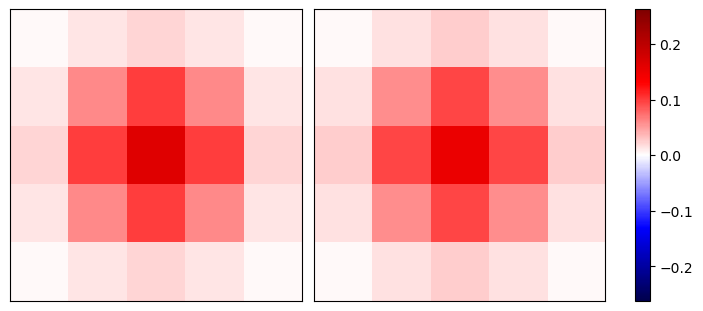

In [67]:
plot_heatmaps([gauss_5, gauss_approx_5])

In [68]:
np.allclose(gauss_5, gauss_approx_5), np.allclose(gauss_5, gauss_approx_5, rtol = 0.25)

(False, True)

In [69]:
gauss_approx_7 = np.array([
    [  0,   0,   1,   2,   1,   0,   0],
    [  0,   3,  13,  22,  13,   3,   0],
    [  1,  13,  59,  97,  59,  13,   1],
    [  2,  22,  97, 159,  97,  22,   2],
    [  1,  13,  59,  97,  59,  13,   1],
    [  0,   3,  13,  22,  13,   3,   0],
    [  0,   0,   1,   2,   1,   0,   0]
]) / 1003



In [70]:
gauss_7 = gaussian_kernel(7)


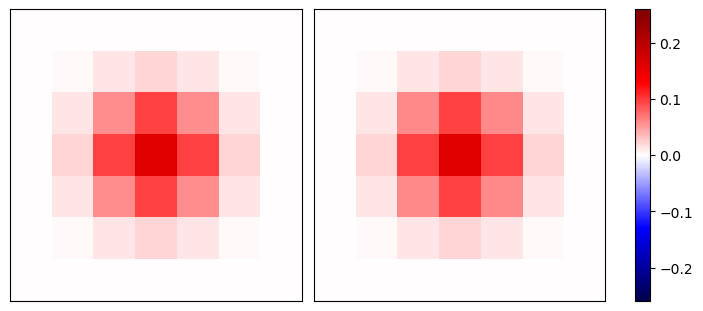

In [71]:
plot_heatmaps([gauss_7, gauss_approx_7])

In [72]:
np.allclose(gauss_7, gauss_approx_7), np.allclose(gauss_7, gauss_approx_7, rtol = 0.9)

(False, False)

In [73]:
eye = cat[230:300, 200:300]

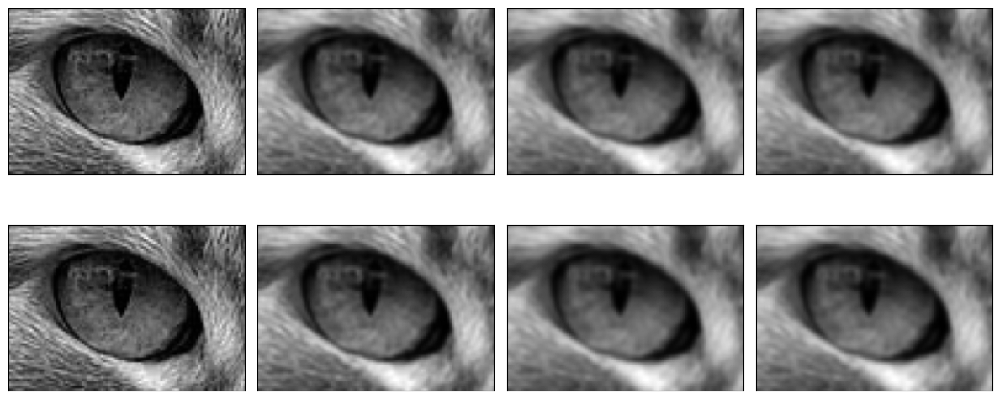

In [74]:
plot_convolutions(eye, filters = [
    identity_filter, 
    gauss_3, 
    gauss_5, 
    gauss_7, 
    identity_filter, 
    gauss_approx_3, 
    gauss_approx_5, 
    gauss_approx_7, 

], ncols=4, nrows=2)

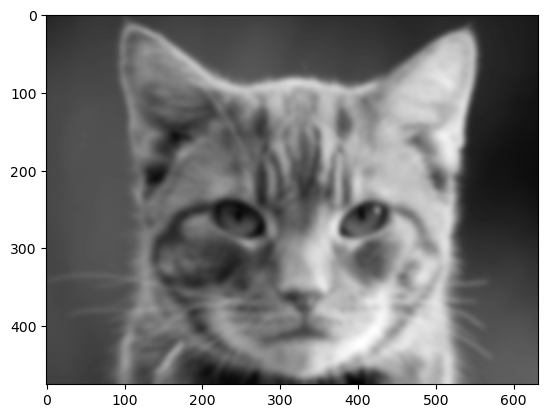

In [75]:
plt.imshow( cv2.GaussianBlur(cat, (21, 21), 0), cmap = "gray")

#### Sobel Filters - Edge Detection

sobel operator wiki

Since the Sobel kernels can be decomposed as the products of an averaging and a differentiation kernel, they compute the gradient with smoothing. For example, 

$ \mathbf {G} _{x} $ and 
$ \mathbf {G} _{y} $ can be written as



Averaging kernel
$
  \begin{bmatrix}
  1 & 2 & 1 
  \end{bmatrix}
$

Diferentiation kernel
$
  \begin{bmatrix}
   1 & 0 & -1
  \end{bmatrix}
$

In [76]:
avg_filter = np.array([[1, 2, 1]])
diff_filter = np.array([[1, 0, -1]])

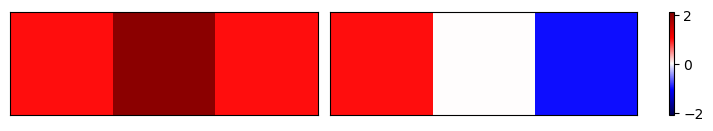

In [77]:
plot_heatmaps([
    avg_filter,
    diff_filter
], figsize_ver = 1.2)

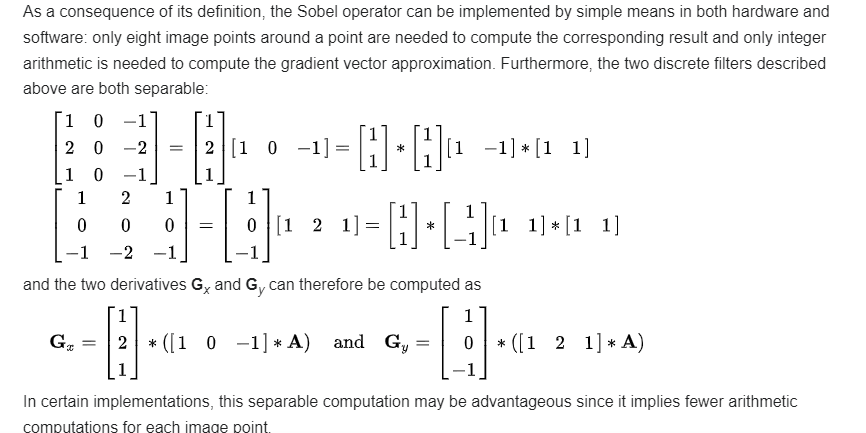

- For horizontal changes (Gx):
  $$
  G_x = \begin{bmatrix}
  1 & 0 & -1 \\
  2 & 0 & -2 \\
  1 & 0 & -1
  \end{bmatrix}
  $$

- For vertical changes (Gy):
  $$
  G_y = \begin{bmatrix}
  1 & 2 & 1 \\
  0 & 0 & 0 \\
  -1 & -2 & -1
  \end{bmatrix}
  $$


In [78]:
# elements for edge detection - Sobel
hor_edge_filter = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1]
])
ver_edge_filter = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]
])

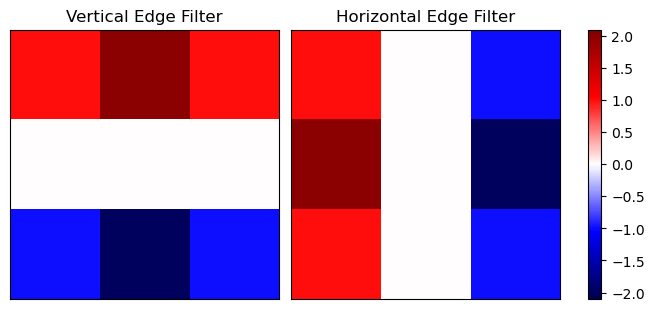

In [79]:
plot_heatmaps(
    [
        ver_edge_filter,
        hor_edge_filter
    ],
    titles = [
        "Vertical Edge Filter",
        "Horizontal Edge Filter"
    ] 
)

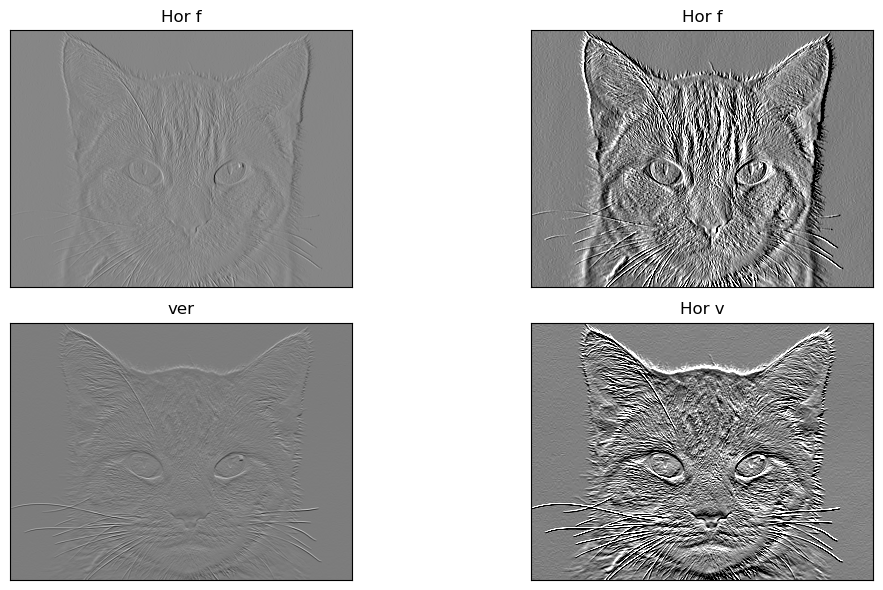

In [80]:
v = 0.4
plot_convolutions(
    cat, 
    filters =[
        hor_edge_filter,
        hor_edge_filter, 
        ver_edge_filter, 
        ver_edge_filter, 
    ], 
    titles = [
        "Hor f",
        "Hor f",
        "ver",
        "Hor v"
    ],
    subplot_kwargs = [
        {},
        {"vmin": -v, "vmax": v},
        {},
        {"vmin": -v, "vmax": v}
    ],
    nrows = 2, 
    ncols = 2
)

In [81]:

# Apply Sobel operator
sobel_x = sobel(cat, axis=0)
sobel_y = sobel(cat, axis=1)

# Combine the two gradients
sobel_combined = np.hypot(sobel_x, sobel_y)


In [82]:
edges_combined = np.hypot(convolve(cat, hor_edge_filter), convolve(cat, hor_edge_filter))

In [83]:
sobel_x.shape

(475, 632)

In [84]:
sobel_combined.min(), sobel_combined.max()

(0.0, 4.035227579874076)

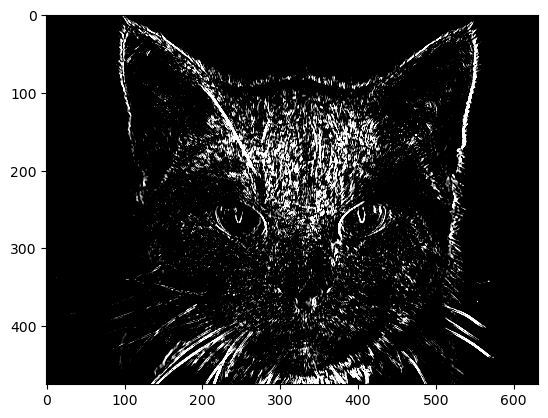

In [85]:
plt.imshow(edges_combined, cmap = "gray", vmin=0.4, vmax=1)
plt.show()

In [86]:
cat.dtype

dtype('float64')

In [87]:

dst = cv2.cornerHarris(np.float32(cat), blockSize=2, ksize=3, k=0.04)
dst.max(), dst.min()

(0.013493989, -0.028839761)

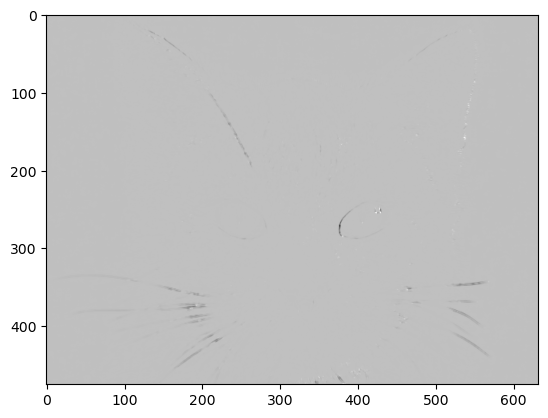

In [88]:
plt.imshow(dst, cmap='gray', vmin=-0.03, vmax=0.01)
plt.show()

https://docs.opencv.org/4.x/dc/d0d/tutorial_py_features_harris.html

In [89]:
dst = cv2.cornerHarris(np.float32(cat), blockSize=2, ksize=3, k=0.04)

r = cat.copy()
g = cat.copy()
b = cat.copy()

# Makes dots bigger
dst = cv2.dilate(dst, np.ones((5, 5), np.uint8))
 
# Threshold for an optimal value, it may vary depending on the image.
limit_value = 0.02
r[dst>limit_value*dst.max()]=1
g[dst>limit_value*dst.max()]=0
b[dst>limit_value*dst.max()]=0

rgb = np.dstack((r,g,b))

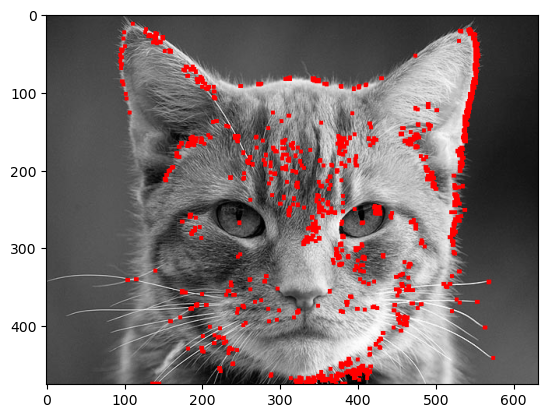

In [90]:
plt.imshow(rgb)
plt.show()

vmin and vmax are min value in the image and max value in the image, small num (here -20, 20) for better contrast of the resulting image, for visualisation only. Vmin to vmax for normal grayscale 0 - 255, here min is - 800ish and max is +800ish.

difference in the values of adjesent pixels is called GRADIENT, high gradient == edge (ръб)

vertex(vertices) - edge of edges (връх)

### Erosion and Dilation

https://www.geeksforgeeks.org/erosion-dilation-images-using-opencv-python/

https://docs.opencv.org/3.4/db/df6/tutorial_erosion_dilatation.html

![Example-of-dilation-and-erosion-in-a-matrix](https://www.researchgate.net/profile/Slimane-Larabi/publication/281654372/figure/fig2/AS:733035053985794@1551780584377/Example-of-dilation-and-erosion-in-a-matrix.ppm)

<img src="https://blogger.googleusercontent.com/img/b/R29vZ2xl/AVvXsEgXsfjxmtZepI49-xZpsp9__x9KdV0pWGKnuKwfZIyGtlWfeRl0k36SHn7GK19dhEPys1v8pVpPUp3de-5tAkCCJl1VLmeazHxpBI28OHqvq91lIkrvDmV9sY80ZyE1IQ3lAlIu5b5puy92/s1600/result.png" alt="Erosion and Dilation Example 1" style="height:300px;">
<img src="https://blogger.googleusercontent.com/img/b/R29vZ2xl/AVvXsEhJuQ0ddTSRqQPAOkrguAph0RuQBcJm82hpV5SJZoMDaR7EXmU3fbZ2gWnqfUhHeJmDdNyTmwirXcXrJU2ORzTSugqs7i_OWgiFN5qs87FhIwVTF1cHwMZY4whz-YbTbZMEHgAMteYy_YUB/s1600/result2.png" alt="Erosion and Dilation Example 1" style="height:300px;">

[images source](https://imagingknowledgebin.blogspot.com/2013/08/morphological-operations.html)


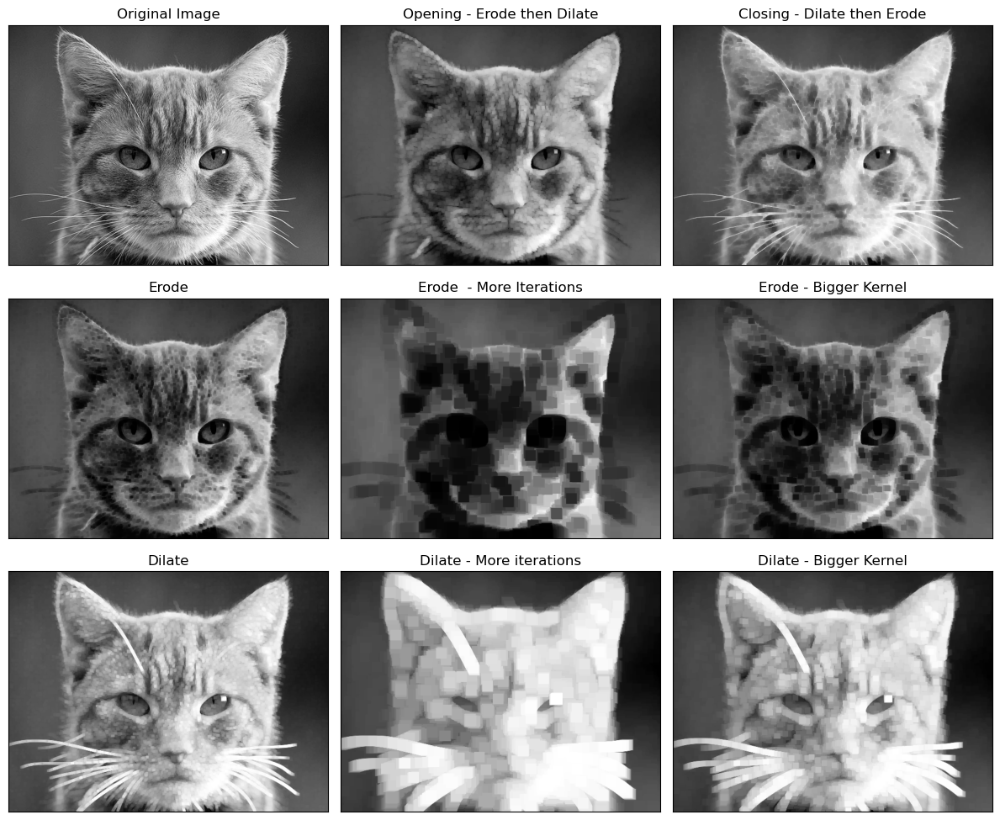

In [16]:
kernel = np.ones((5, 5), np.uint8)
kernel_big = np.ones((11, 11), np.uint8)
image = cat

plot_image_subplots(
    [
        image, 
        cv2.dilate(cv2.erode(image, kernel, iterations=1), kernel, iterations = 1), 
        cv2.erode(cv2.dilate(image, kernel, iterations=1), kernel, iterations = 1), 
        cv2.erode(image, kernel, iterations=1), 
        cv2.erode(image, kernel, iterations=5), 
        cv2.erode(image, kernel_big, iterations=1),
        cv2.dilate(image, kernel, iterations=1),
        cv2.dilate(image, kernel, iterations=5), 
        cv2.dilate(image, kernel_big, iterations=1), 
    ], 
    titles = [
        "Original Image",
        "Opening - Erode then Dilate",
        "Closing - Dilate then Erode",
        "Erode",
        "Erode  - More Iterations",
        "Erode - Bigger Kernel",
        "Dilate",
        "Dilate - More iterations",
        "Dilate - Bigger Kernel",
    ],
    nrows=3, 
    ncols = 3, 
    figsize_ver=10
)


## Convolutional Neural Networks

In [2]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models

In [4]:


# Load and preprocess the MNIST dataset
(train_images, train_labels), (test_images, test_labels) = datasets.mnist.load_data()

# Normalize the images to the range [0, 1]
train_images = train_images / 255.0
test_images = test_images / 255.0

# Add a channels dimension
train_images = train_images[..., tf.newaxis]
test_images = test_images[..., tf.newaxis]

# Convert labels to binary: 1 for class '8', 0 for others
train_labels = (train_labels == 8).astype(int)
test_labels = (test_labels == 8).astype(int)

# Define the CNN model
model = models.Sequential([
    layers.Conv2D(1, (3, 3), activation='relu', input_shape=(28, 28, 1)), # Single convolutional layer with one 3 x 3 filter
    layers.Flatten(),
    layers.Dense(1, activation='sigmoid')  # Single output neuron for binary classification
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(train_images, train_labels, epochs=1)

# Evaluate the model
test_loss, test_acc = model.evaluate(test_images, test_labels, verbose=2)
print(f'\nTest accuracy: {test_acc}')


1875/1875 [==============================] - 12s 6ms/step - loss: 0.1798 - accuracy: 0.9388
313/313 - 1s - loss: 0.1112 - accuracy: 0.9635 - 1s/epoch - 3ms/step

Test accuracy: 0.9635000228881836


In [5]:
test_images[0].shape

(28, 28, 1)

In [6]:
idx_to_plot = range(4*8)
images_to_plot = np.array([test_images[i] for i in idx_to_plot])
predictions = model.predict(images_to_plot)
titles = [f"{prob[0]:.4f}" for prob in predictions.tolist()]



NameError: name 'np' is not defined

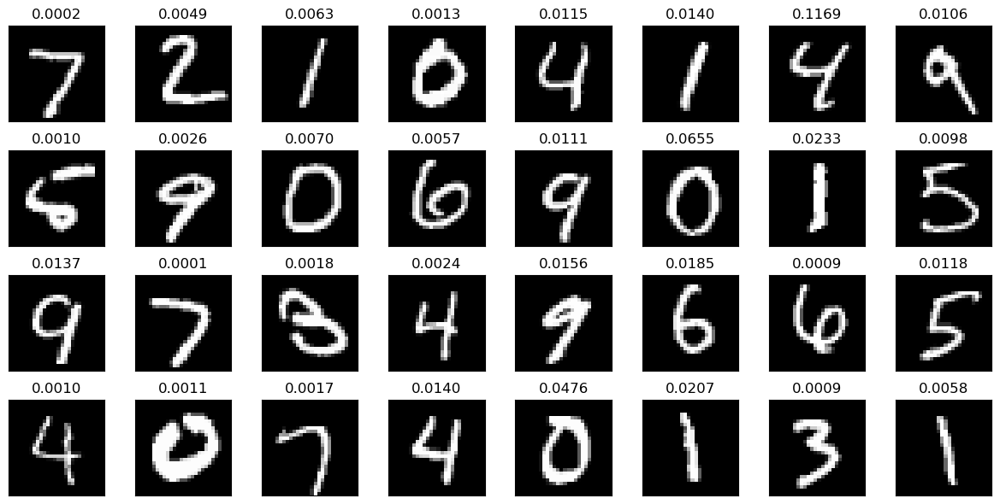

In [ ]:
plot_image_subplots(images_to_plot, titles=titles, nrows = 4, ncols = 8)

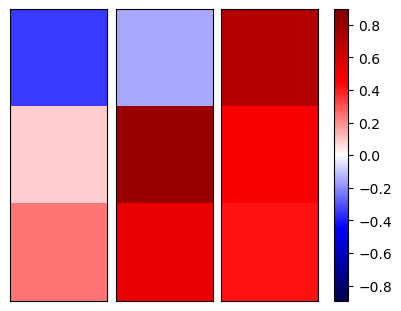

In [ ]:
conv_layer = model.layers[0]
kernel_weights, bias = conv_layer.get_weights()

plot_heatmaps(kernel_weights, ncols=3)

In [ ]:
kernel_weights

array([[[[-0.3457374 ]],

        [[ 0.08500817]],

        [[ 0.24124144]]],


       [[[-0.15131728]],

        [[ 0.7945317 ]],

        [[ 0.5171823 ]]],


       [[[ 0.6998973 ]],

        [[ 0.46294546]],

        [[ 0.41510323]]]], dtype=float32)